<a href="https://colab.research.google.com/github/WMaia9/Analise_Preditiva/blob/main/Nasa_Analise__Dados.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Notebook para visualizar os dados e encontrar alguns insights

In [ ]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import importlib
import random
from pandas import read_csv, set_option

In [ ]:
names=["id", "runtime", "Setting1", 'Setting2', 'Setting3', 'Tag1', 'Tag2', 'Tag3', 'Tag4', 
       'Tag5','Tag6', 'Tag7', 'Tag8', 'Tag9', 'Tag10', 'Tag11', 'Tag12', 'Tag13', 
       'Tag14', 'Tag15', 'Tag16', 'Tag17', 'Tag18', 'Tag19', 'Tag20', 'Tag21']

In [ ]:
# get the trainig data
df = pd.read_csv('PM_train.txt', header=None, delimiter=r"\s+", names=names)

In [ ]:
print(df.shape)
pd.set_option('display.max_columns', None)

(20631, 26)


In [ ]:
df

,id,runtime,Setting1,Setting2,Setting3,Tag1,Tag2,Tag3,Tag4,Tag5,Tag6,Tag7,Tag8,Tag9,Tag10,Tag11,Tag12,Tag13,Tag14,Tag15,Tag16,Tag17,Tag18,Tag19,Tag20,Tag21
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,1.3,47.47,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,1.3,47.49,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,1.3,47.27,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,1.3,47.13,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,21.61,554.00,2388.06,9055.15,1.3,47.28,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,21.61,551.43,2388.19,9065.52,1.3,48.07,519.49,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,21.61,550.86,2388.23,9065.11,1.3,48.04,519.68,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,21.61,550.94,2388.24,9065.90,1.3,48.09,520.01,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,21.61,550.68,2388.25,9073.72,1.3,48.39,519.67,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640


In [ ]:
sns.set()

def labels(x, y, *axes):
  for axis in axes:
    if x: axis.set_xlabel(x)
    if y: axis.set_ylabel(y)

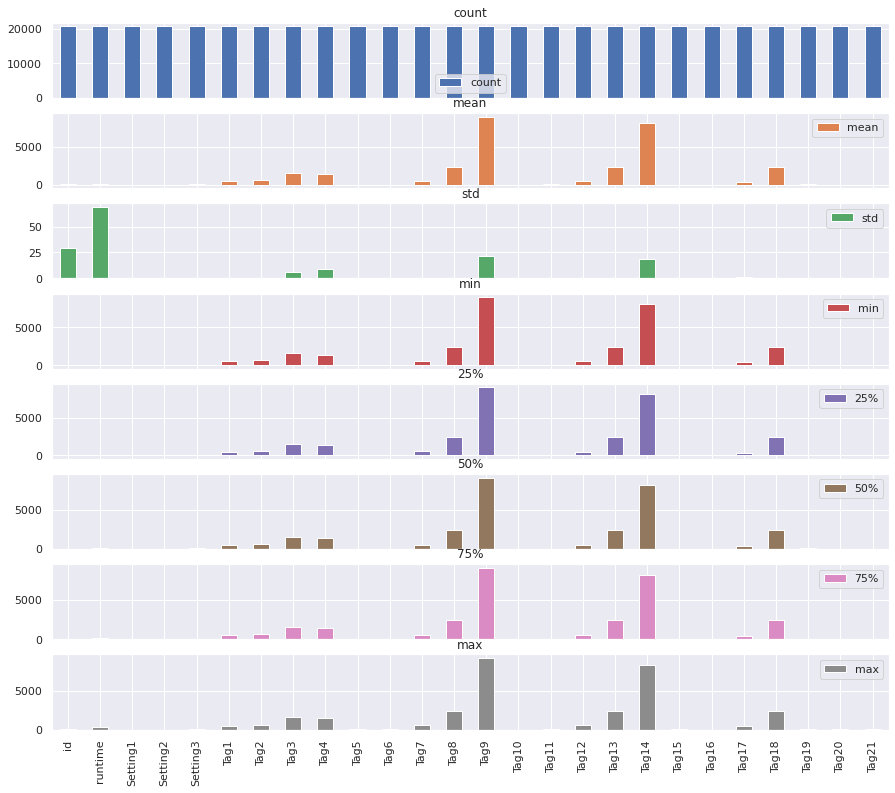

In [ ]:
axes = df.describe().T.plot.bar(subplots=True, figsize=(15,13))

# Fazendo uma coluna para os dados de destino RUL
De acordo com o documento de descrição de dados, o conjunto de dados contém várias unidades, cada unidade começa em um determinado ponto de degradação e os dados de medição terminam bem antes da unidade ser desativada por quebra.

Portanto, suponha que, para o último tempo de medição que está disponível para uma unidade, as unidades RUL = 0 (parou de medir pouco antes da quebra da máquina)

In [ ]:
# obtém a hora da última medição disponível para cada unidade
mapper = {}
for id in df['id'].unique():
  mapper[id] = df['runtime'].loc[df['id'] == id].max()

# calculr RUL = time.max() - time_now for each unit
df['RUL'] = df['id'].apply(lambda id: mapper[id]) - df['runtime']

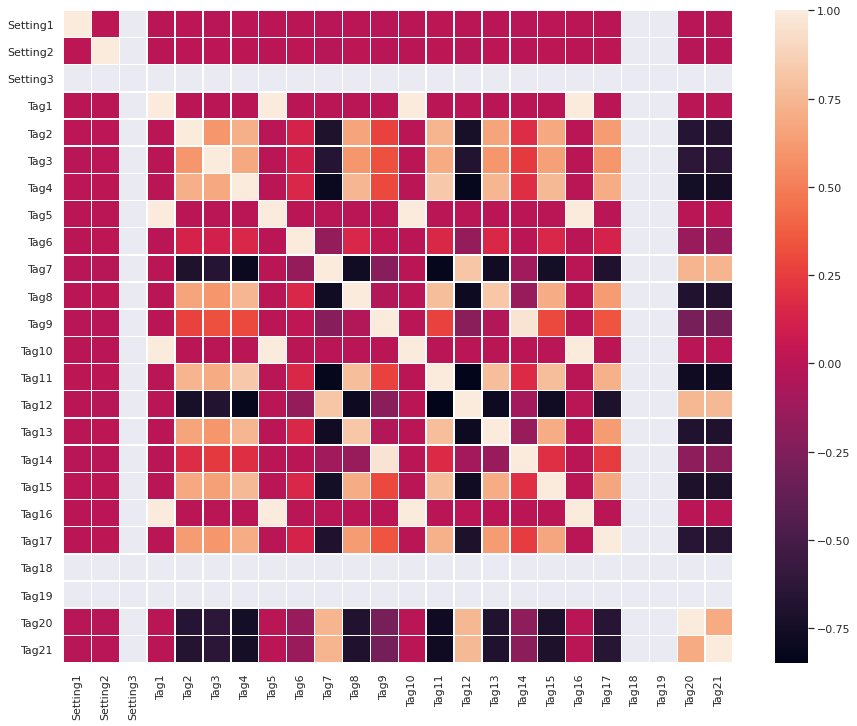

In [ ]:
#Plot a matriz de correlação

df_sub = df.copy()
del df_sub['id']
del df_sub['RUL']

df_sub.set_index('runtime', inplace=True)

df_corr = df_sub.corr(method='pearson')
fig, ax = plt.subplots(figsize=(15,12))
sns.heatmap(df_corr, linewidths=0.5);

Podemos ver que algumas linhas na matriz de correlação são mostradas em cinza, o que indica dados corrompidos. Vamos dar uma olhada nos dados.

# Encontre NaN ou Const Sensos / Dados do estado da operação:

In [ ]:
cols_nan = df.columns[df.isna().any()].tolist()
print('Columns with all nan: \n' + str(cols_nan) + '\n')

cols_const = [ col for col in df.columns if len(df[col].unique()) <= 2 ]
print('Columns with all const values: \n' + str(cols_const) + '\n')

Columns with all nan: 
[]

Columns with all const values: 
['Setting3', 'Tag1', 'Tag5', 'Tag6', 'Tag10', 'Tag16', 'Tag18', 'Tag19']



Como podemos ver, existem colunas com valores constantes. Como não há ganho e eles são redundantes para modelos de aprendizado de máquina, vamos excluí-los.

In [ ]:
df = df.drop(columns = cols_const)

Vamos dar uma olhada na correlação novamente

In [ ]:
set_option('precision', 4)
df_sub = df.copy()
del df_sub['id']
del df_sub['RUL']

df_sub.set_index('runtime', inplace=True)
df_sub.dropna(axis=1, how='all', inplace=True)

df_corr = df_sub.corr(method='pearson')
df_corr2 = pd.DataFrame(np.tril(df_corr.values), columns=df_corr.columns, index = df_corr.index)

correlating = []
for col in df_corr2.columns:
    ser = df_corr2[col]
    idx = np.logical_or(-0.8 > ser,  ser > 0.8)
    for i, c in zip(ser[idx].index, ser[idx].values):
        if (i, col, c) not in correlating and i != col:
            correlating.append((col, i, c))

print('highly correlating measurements:')
for c in correlating:
    print(c)

highly correlating measurements:
('Tag4', 'Tag11', 0.8301356963159666)
('Tag4', 'Tag12', -0.8155905161052416)
('Tag7', 'Tag11', -0.8228050249957727)
('Tag7', 'Tag12', 0.8127126013254434)
('Tag8', 'Tag13', 0.8260843322358152)
('Tag9', 'Tag14', 0.9631566003059564)
('Tag11', 'Tag12', -0.8468835930051064)


Nós podemos ver isso:


* sensor 09 e sensor 14 são quase colineares
* sensor 08 e sensor 13 colinear relativamente forte
* sensores 11 e 12 são relativamente fortes colineares inversamente
* sensor 07 correlaciona-se com o par 11 e 12
* o sensor 04 se correlaciona com o par 11 e 12 também

uma vez que ambos os sensores 08 e 11 parecem estar correlacionados com o grop 11 e 12, vamos dar uma olhada em sua correlação, mesmo que não tenha aparecido na definição acima:

In [ ]:
df_corr['Tag7'].loc['Tag4']

-0.7931295615103593

Portanto, pode-se ver que, de fato, as duas colunas também estão correlacionadas, mas não atingiram o limite de 0,7 de cima.

Agora plote os sinais do sensor com suas distribuições e progressões de tempo por unidades.

# Plots de tempo e distribuição

vamos primeiro definir algumas funções auxiliares

In [ ]:
def exclude_trivial(df_sub):
    cols = []
    for col in df_sub.columns:
        if col == 'id':
            continue
        elif col == 'RUL':
            continue
        elif len(df_sub[col].unique()) <= 2:
            continue
        else:
            cols.append(col)
            
    return df_sub[cols].copy()

In [ ]:
def get_data_non_trivial(df, id, ):
    df_sub = df.loc[df['id'] == id].copy()
    df_sub.set_index('runtime', inplace=True)
    df_sub.dropna(axis=1, how='all', inplace=True)
    
    df_sub = exclude_trivial(df_sub)
    return df_sub

In [ ]:
def get_data_by_cols_and_unit(df, id, cols):
    df_sub = df.loc[df['id'] == id].copy()
    df_sub.set_index('runtime', inplace=True)
    df_sub.dropna(axis=1, how='all', inplace=True)
    
    df_sub = df_sub[cols]
    return df_sub

In [ ]:
def plot_ts_by_unit(df, id, wind_size):
    '''plot all non trivial measurements and states'''
    df_sub = get_data_non_trivial(df, id)
    cols = df_sub.columns
    fig, axes = plt.subplots(len(cols), 1, figsize=(15,12))
    
    for col, ax in zip(cols, axes):
        df_sub[col].plot(ax = ax)
        df_sub[col].rolling(wind_size).median().plot(ax = ax)
        df_sub[col].rolling(wind_size).mean().plot(style = '--', legend=True, ax = ax)
    fig.suptitle('Asset id: {}'.format(id))

def plot_hist_by_unit(df, id, wind_size):
    '''plot all non trivial measurements and states'''
    df_sub = get_data_non_trivial(df, id)
    cols = df_sub.columns
    n_cols = min(len(cols), 5)
    n_rows = int(np.ceil(len(cols) / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15,12))
    axes = axes.flatten()
    for col, ax in zip(cols, axes):
        sns.distplot(df_sub[[col]], ax=ax, label=col)
        labels(col, "p", ax)
    fig.suptitle('Asset id: {}'.format(id))

In [ ]:
mapper_by_length = sorted(mapper.items(), key=lambda kv: kv[1])
wind_size = 20

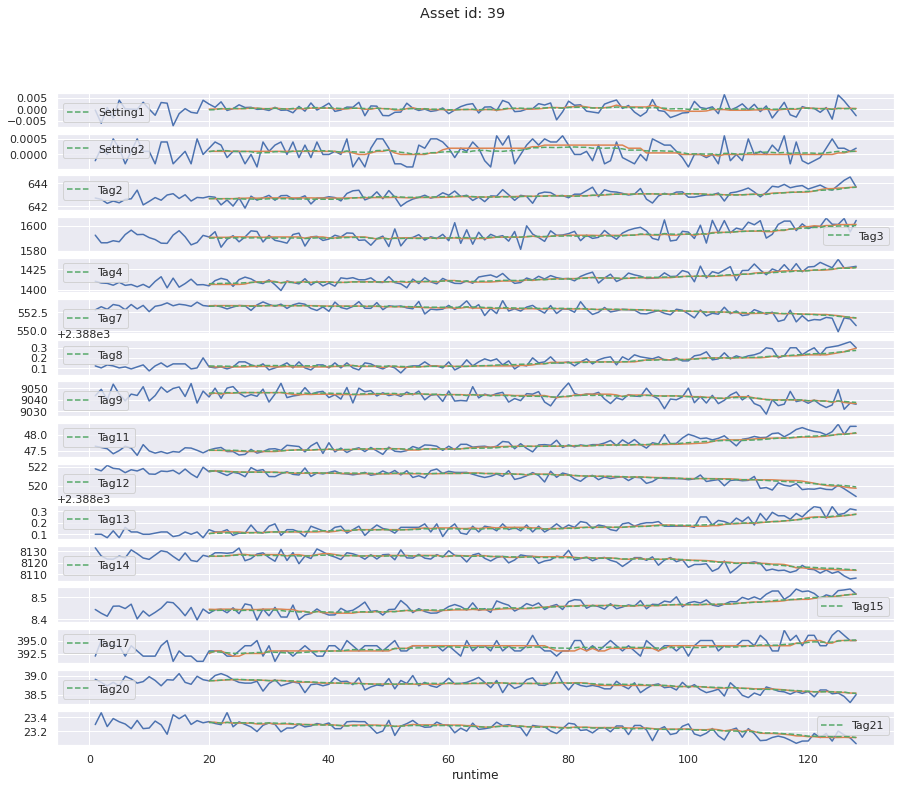

In [ ]:
# plot shortes operating machine data
unit_to_plot = mapper_by_length[0][0]
plot_ts_by_unit(df, unit_to_plot, wind_size)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

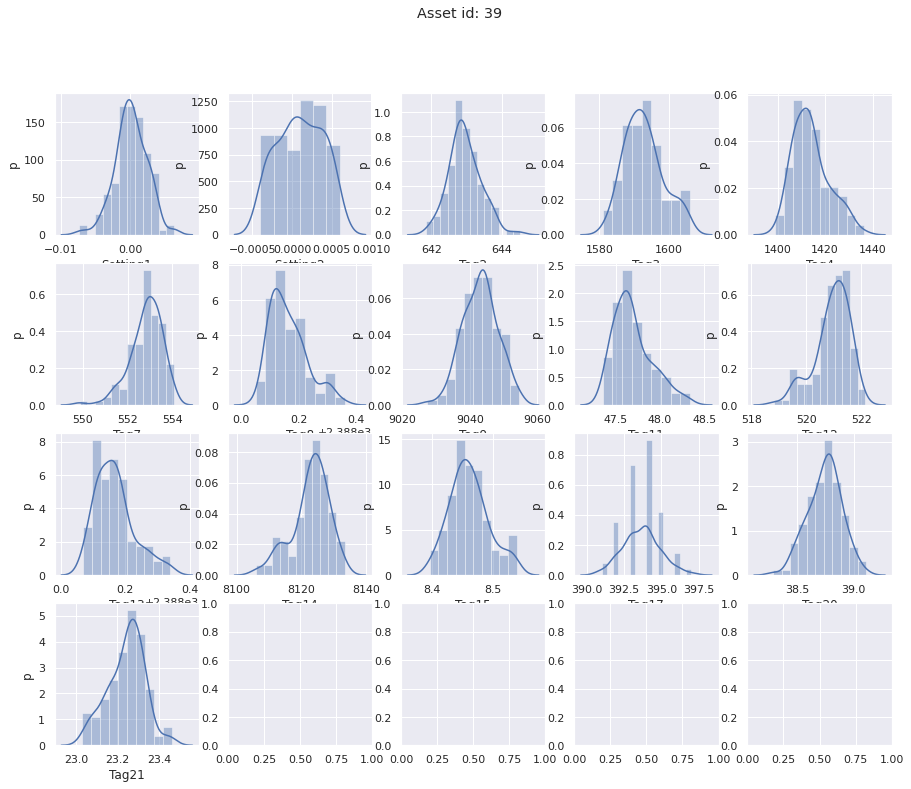

In [ ]:
plot_hist_by_unit(df, unit_to_plot, wind_size)

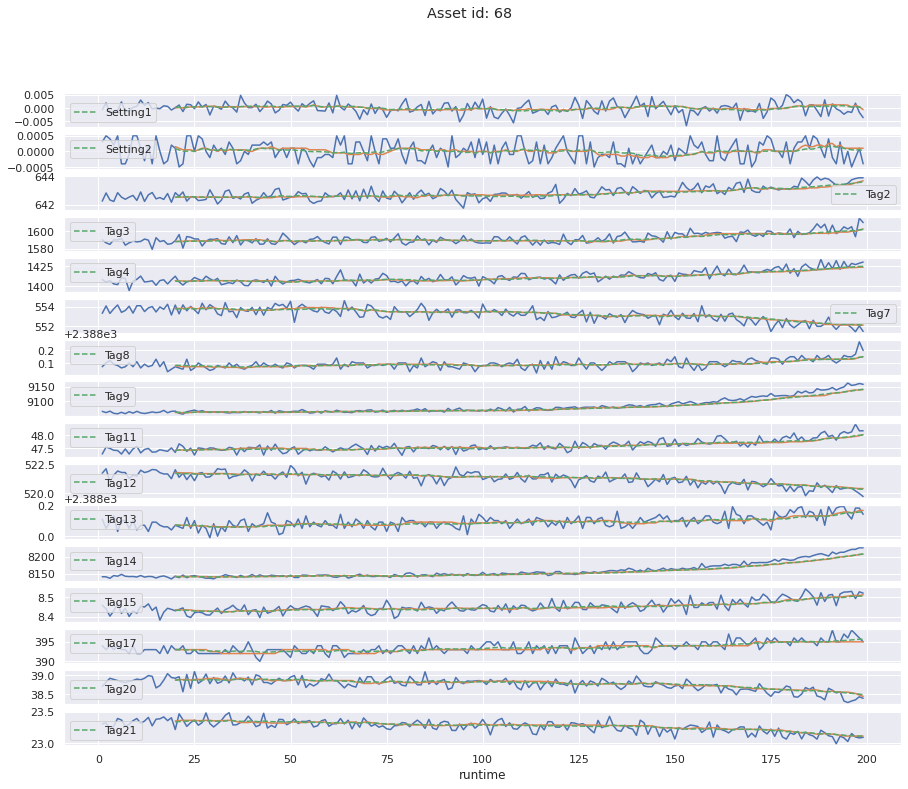

In [ ]:
# traçar dados da máquina operacional em tempo médio
unit_to_plot = mapper_by_length[int(len(mapper)/2)][0]
plot_ts_by_unit(df, unit_to_plot, wind_size)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

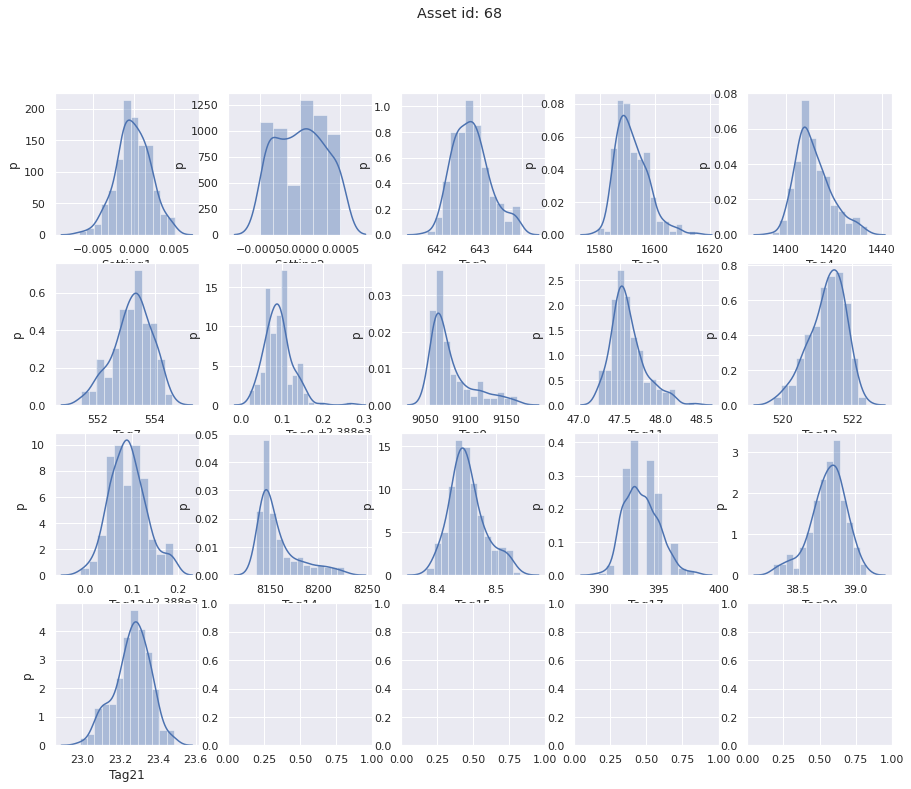

In [ ]:
plot_hist_by_unit(df, unit_to_plot, wind_size)

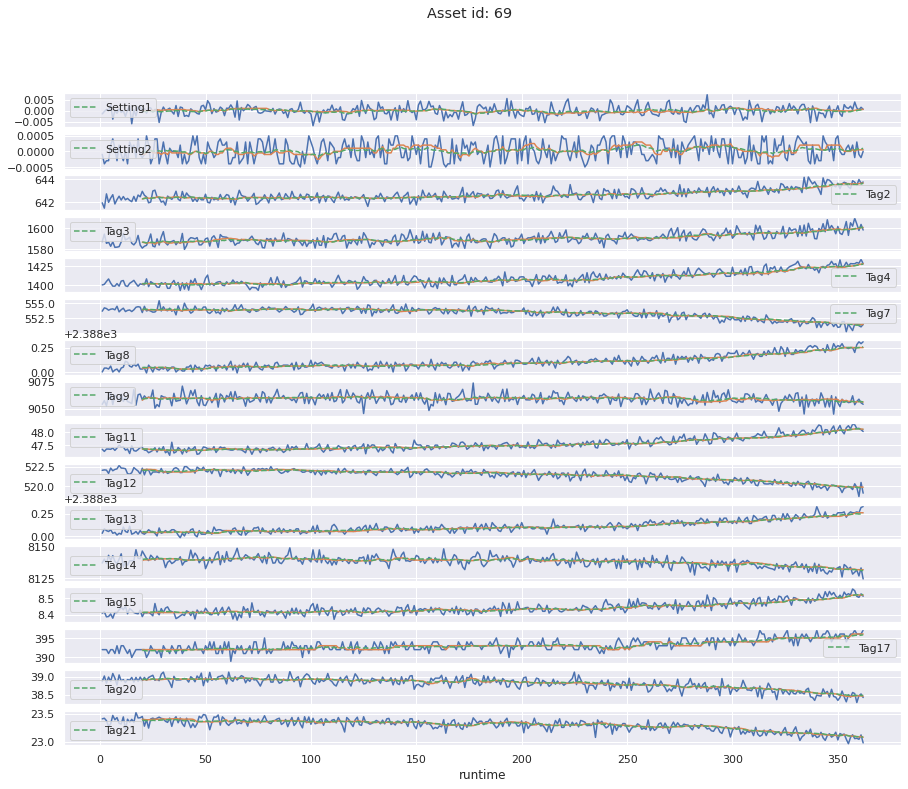

In [ ]:
# traçar os dados mais longos da máquina operacional
unit_to_plot = mapper_by_length[-1][0]
plot_ts_by_unit(df, unit_to_plot, wind_size)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

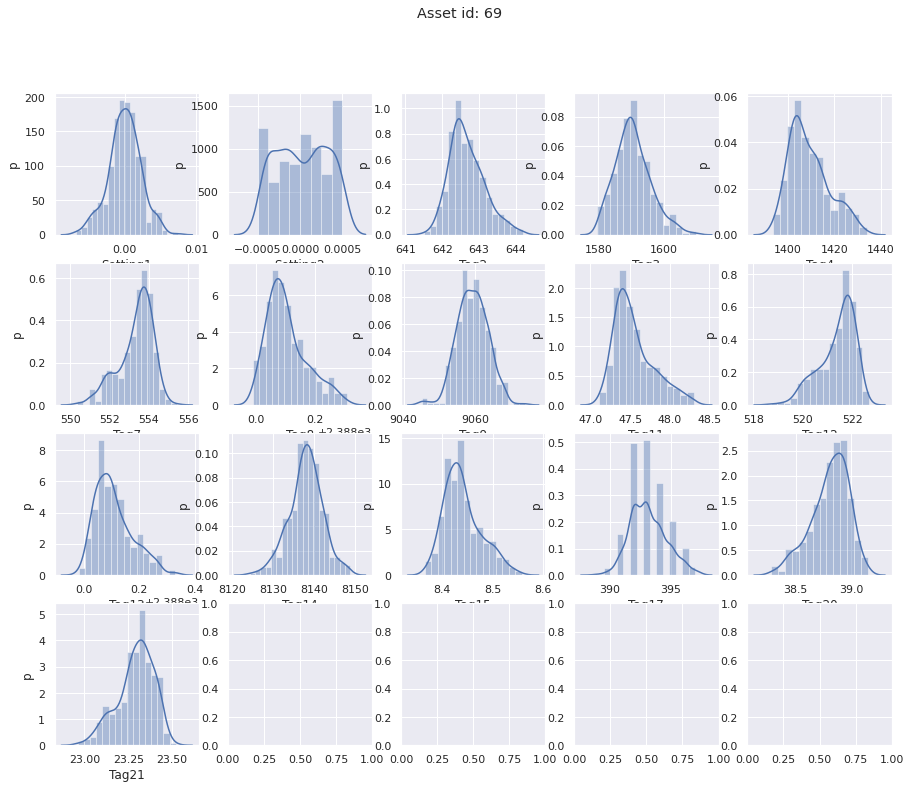

In [ ]:
plot_hist_by_unit(df, unit_to_plot, wind_size)

Olhando os gráficos de histograma, podemos ver que Tag17 tem um comportamento diferente dos outros. Vamos examinar isso mais de perto.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

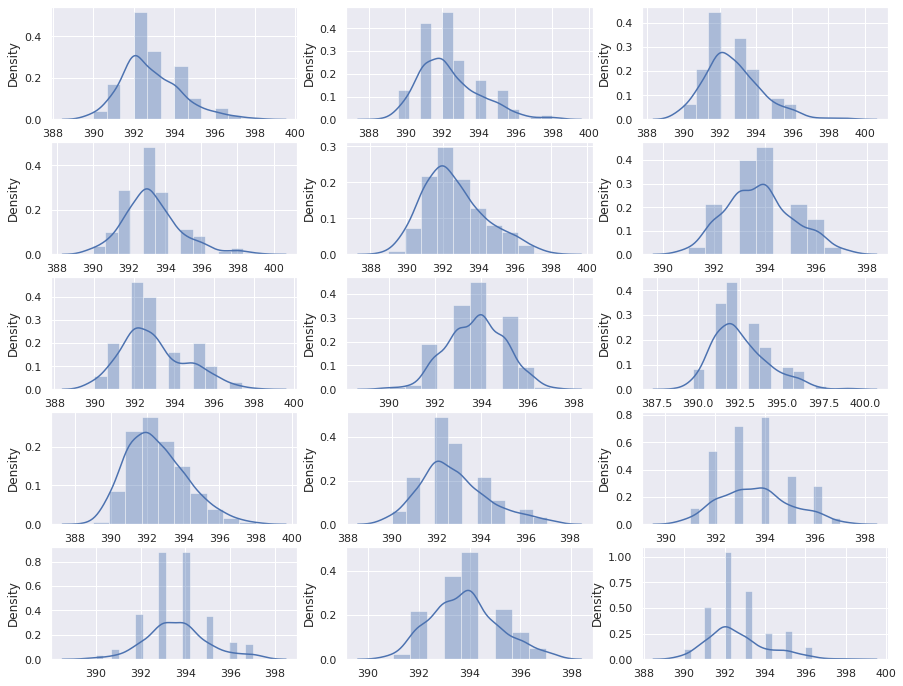

In [ ]:
n_units = 15

dfs = [df for nr, df in df.groupby('id')]
smpls = random.sample(dfs, 15)
fig, axes = plt.subplots(5, 3, figsize=(15,12))
axes = axes.flatten()
for df_now, ax in zip(dfs, axes):
    sns.distplot(df_now[['Tag17']], ax=ax)

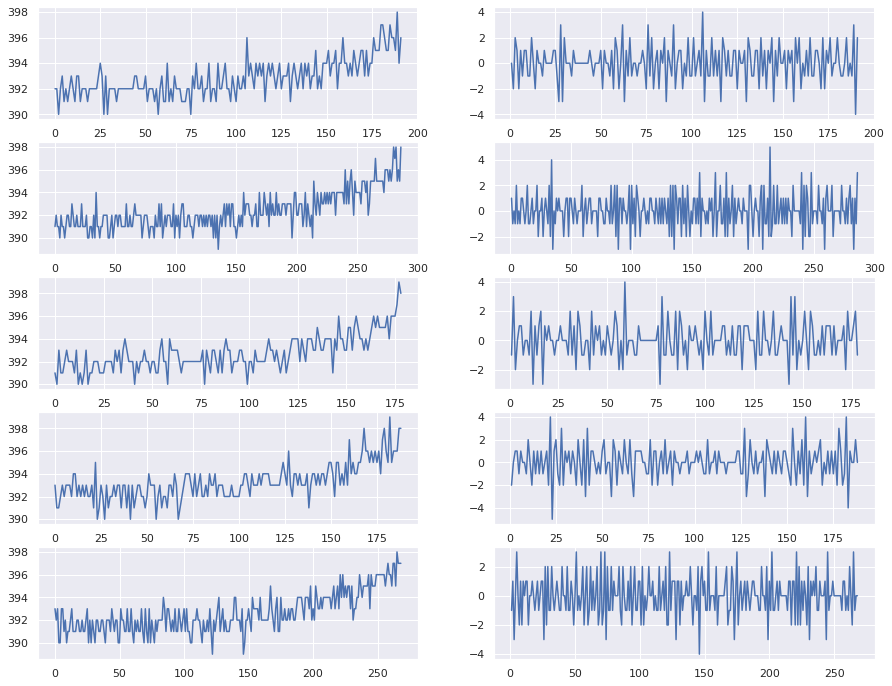

In [ ]:
fig, axes = plt.subplots(5, 2, figsize=(15,12))
cnt = 0
for df_now, ax in zip(dfs, range(5)):
    ser = df_now['Tag17']
    axes[cnt, 0].plot(ser.values)
    axes[cnt, 1].plot(ser.diff().values)
    cnt += 1

In [ ]:
step_sizes = []
for nr, df_local in df.groupby('id'):
    step_sizes += list(set(df_local['Tag17'].unique()))
step_sizes = set(step_sizes)
print(step_sizes)

{388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400}


'Tag 17' mostra um comportamento de 'stepping', onde todos os passos são sempre inteiros completos. Esta propriedade sugere uma [quantização](https://en.wikipedia.org/wiki/Quantization (signal_processing)) de inteiro completo.

# Dividindo o dataframe por unidades

In [ ]:
dfs_by_unit = {}

RULs_max = {}
for unit_nr in df['id'].unique():
    dfs_by_unit[id] = df.loc[df['id'] == unit_nr].copy()

#Visualizando os tempos de execução individuais para cada unidade

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


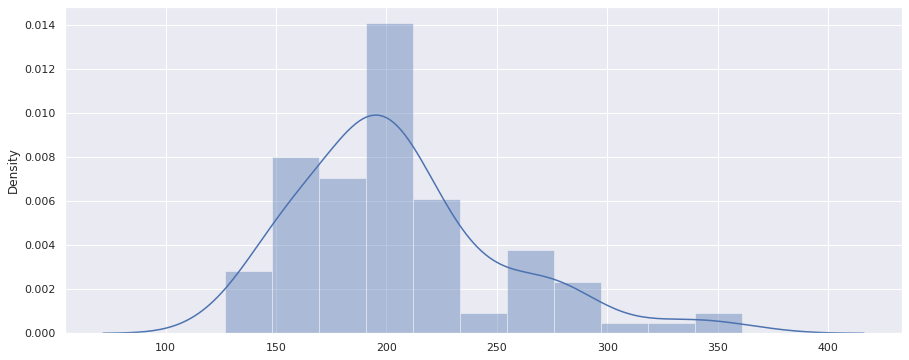

In [ ]:
RULs_max = dict([(nr, v['RUL'].values[0]) for nr, v in df.groupby('id')]) 
fig = plt.figure(figsize=(15, 6))
ax2 = sns.distplot(pd.Series(RULs_max) ,label='operation times')

Assim, descobrimos que os tempos de operação máximo e mínimo através das unidades variam de cerca de 125 ciclos a cerca de 350 ciclos, o que é cerca de 280% de mínimo a máximo. Deve ser seguro dizer que há uma variação significativa entre o RUL de unidades diferentes. No entanto, não se sabe se o estado inicial representa o estado de desgaste no comissionamento, ou algum tipo de estado de desgaste ao longo da vida útil das unidades.

# Visualizando a transição de estado combinada para todas as unidades

In [ ]:
def plot_grouped_by_RUL(df_sub, leg=True):

    cols = [col for col in df_sub.columns if len(df_sub[col].unique()) > 2]
    cols_data = [col for col in cols if col.startswith('Tag') or col.startswith('Setting')]

    g = sns.PairGrid(data=df_sub, x_vars="RUL", y_vars=cols_data,hue="id", height=2, aspect=6,)
    g = g.map(plt.plot, alpha=0.5)
    g = g.set(xlim=(df_sub['RUL'].max(),df_sub['RUL'].min()))
    if leg:
        g = g.add_legend()

#Na linha do tempo RULE absoluta

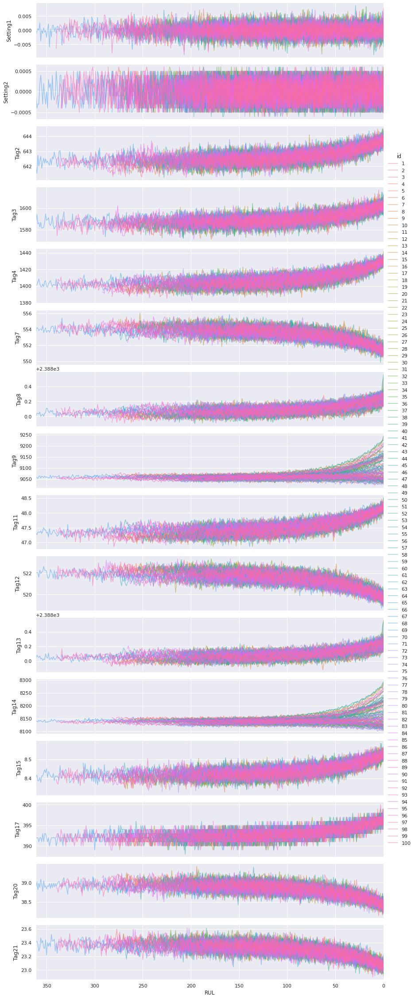

In [ ]:
cols = [col for col in df.columns if len(df[col].unique()) > 2]
cols_data = [col for col in cols if col.startswith('Tag') or col.startswith('Setting')]

plot_grouped_by_RUL(df[cols].copy())

#Em cada unidade cronograma RUL relativo

agora normalize a linha do tempo, de modo que para cada unidade o RUL seja 0..1 indicando seu ciclo de vida individual desde o início da primeira medição até a última medição

In [ ]:
from ProcessingHelpers import normalize_col_by_unit
import ProcessingHelpers
import PlottingHelpers
importlib.reload(ProcessingHelpers) 
importlib.reload(PlottingHelpers) 

<module 'PlottingHelpers' from '/content/PlottingHelpers.py'>

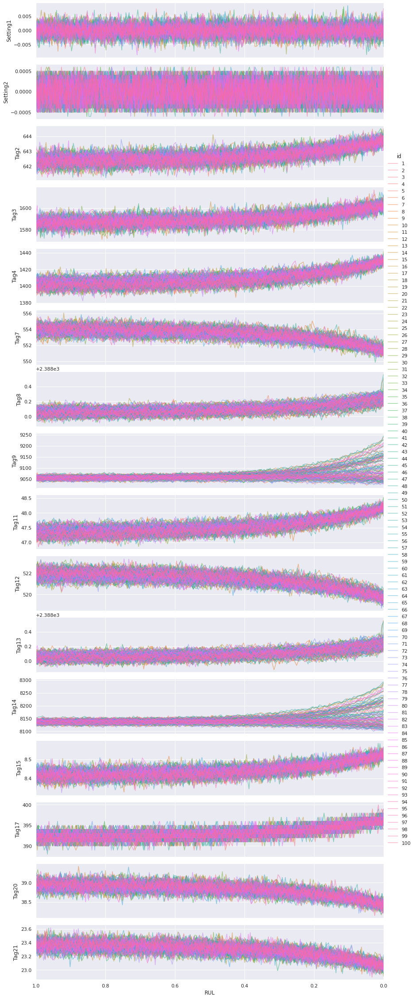

In [ ]:
df_rel = ProcessingHelpers.normalize_col_by_unit(df[cols].copy(), 'RUL')
plot_grouped_by_RUL(df_rel)


Pode-se ver facilmente que:

* os estados de operação parecem não ter estado de mudança lenta devido à degradação (o que faz todo o sentido)
* os sinais dos sensores 2, 3, 4, 7, 8, 11, 12, 13, 15, 17, 20 e 21 mostram comportamento semelhante de queda ou elevação lenta com degradação, em que todas as unidades tendem a cair ou aumentar os valores , nunca ambos.
* os sinais 9 e 14 também mostram um comportamento de queda ou elevação lenta com degradação, no entanto, aqui as várias unidades se comportam de forma diferente com comportamento de queda ou elevação até o final da vida útil.
* algumas unidades geralmente têm valores mais altos ou mais baixos do que as outras, uma vez que ambos os gráficos de imagem mostram linhas horizontais e o número da unidade está no eixo y. Também parece que todas as unidades têm variações comparáveis ao longo de toda a vida operacional. No entanto, isso contradiz os gráficos de tempo absolutos mostrados um pouco mais acima. Portanto, parece necessário investigar um pouco mais sobre as variações

# plotar as variações contínuas para cada medição, para ver como elas se relacionam
Para investigar as variâncias, aplicaremos uma janela flutuante com 5% de todo o sinal como tamanho da janela e um fator de subamostragem de 0 (não subamostra) aos dados e calcularemos a variância sobre eles.

# Em absoluto RUL

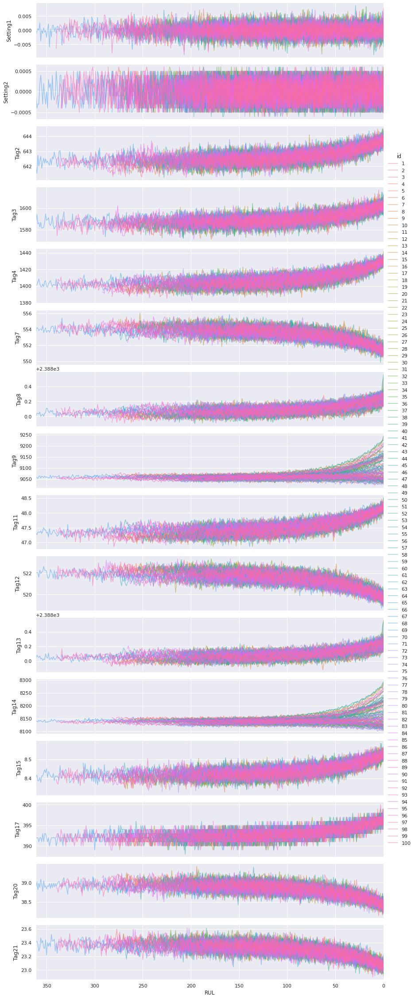

In [ ]:
df_var = ProcessingHelpers.apply_rolling_by_unit(df, np.var, win_size_p=0.05, subsample=0)
plot_grouped_by_RUL(df_var)

# No URL relativo

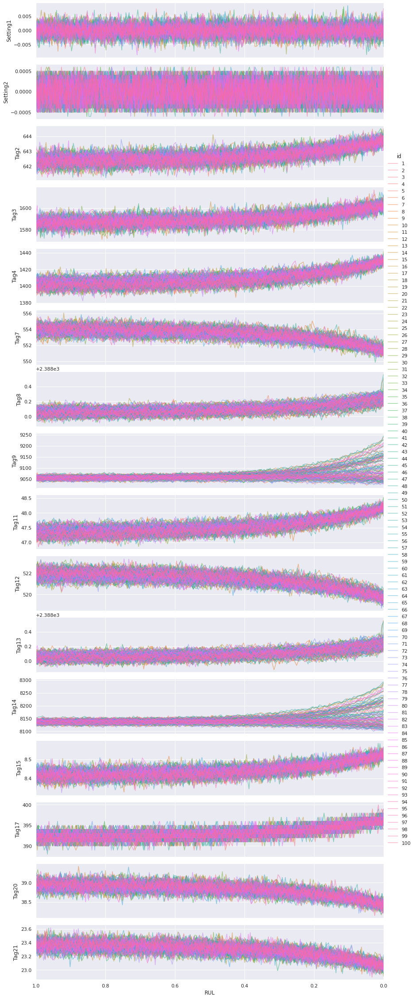

In [ ]:
df_rel_var = ProcessingHelpers.apply_rolling_by_unit(df_rel, np.var, win_size_p=0.05, subsample=0)
plot_grouped_by_RUL(df_rel_var)

Os sinais das medições:

* sensor_08
* sensor_09
* sensor_13
* sensor_14

parece ter uma variação crescente para o final, vamos dar uma olhada nisso.

# Concentre-se nas áreas onde as variações estão mudando

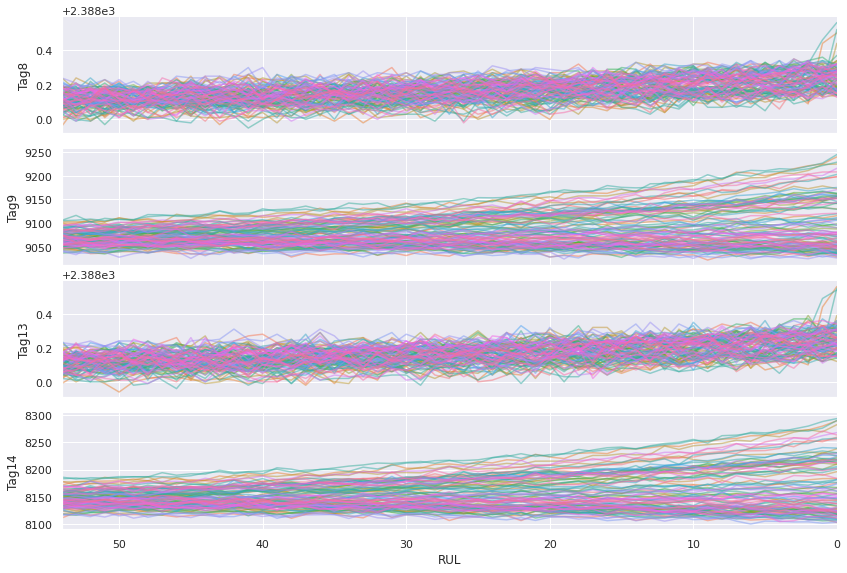

In [ ]:
df_end = df[['RUL', 'id', 'Tag8', 'Tag9', 'Tag13', 'Tag14']]
df_end = df_end.loc[df['RUL'] < 55.0].copy()

df_end_var = ProcessingHelpers.apply_rolling_by_unit(df_end, np.var, win_size_p=10, subsample=0)

plot_grouped_by_RUL(df_end_var, leg=False)

Pode-se observar que a mudança na variância não ocorre para todas as unidades, portanto, esta informação deve ser tratada com cuidado, ao se projetar um sistema de previsão RUL.

vamos dar uma olhada nos estados iniciais e medidas do sistema.

# Mostrar variações entre unidades das condições iniciais:

,rel_full_perc,mean,var,max,min
Tag2,9.9827e-03,642.3759,0.0641,643.0122,641.8367
Tag3,4.3916e-01,1586.8073,6.9686,1592.7489,1582.0967
Tag4,1.4023e+00,1402.6493,19.6700,1410.4567,1394.1211
Tag7,4.6375e-02,553.9631,0.2569,555.0322,552.7800
Tag8,9.1226e-05,2388.0580,0.0022,2388.1411,2387.9689
Tag9,6.1461e-01,9055.9709,55.6591,9072.2178,9039.8100
Tag11,4.6522e-02,47.3497,0.0220,47.6500,47.0867
Tag12,3.5944e-02,521.9288,0.1876,522.5911,521.1033
Tag13,9.4180e-05,2388.0556,0.0022,2388.1578,2387.9756
Tag14,6.8569e-01,8137.3113,55.7968,8152.4867,8121.3600


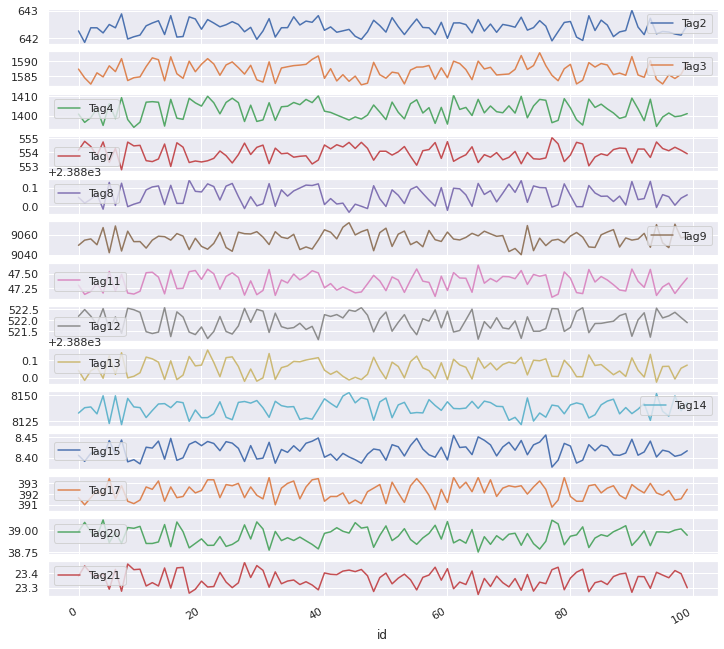

In [ ]:
means = []
vars = []
df_start = df.loc[df['runtime'] < 10.0].copy()
cols_data = [col for col in df.columns if col.startswith('Tag')]

for nr, df_tmp in df_start.groupby('id'):
    means.append(df_tmp[cols_data].mean())
    vars.append(df_tmp[cols_data].var())
df_means = pd.DataFrame(means)
df_vars = pd.DataFrame(vars)

print('')
dc2 = {}
ax = df_means.plot(subplots=True, figsize=(12, 12))
plt.xlabel('id')

pd.DataFrame({
    'rel_full_perc': df_means.var() / df_means.mean() * 100,
    'mean': df_means.mean(),
    'var': df_means.var(),
    'max': df_means.max(),
    'min': df_means.min()
})

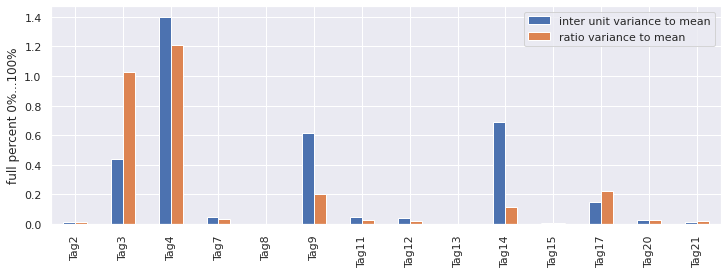

In [ ]:
df_perc = pd.DataFrame(
    {
        'inter unit variance to mean': df_means.var() / df_means.mean(),
        'ratio variance to mean': df_vars.mean() / df_means.mean()
    })
ax2 = (df_perc * 100).plot.bar(figsize=(12, 4))
txt = plt.gca().set_ylabel('full percent 0%...100%')

Portanto, os valores variam com no máximo 1,4% entre unidades diferentes, o que torna seguro assumir que todas as máquinas neste conjunto de dados têm estados e condições iniciais comuns. Além disso, pode-se dizer que a variância das medidas para os primeiros 10 ciclos é de cerca de no máx. 1,2% do valor médio. Essas informações podem ser usadas para polarização e dimensionamento de todos os recursos para pré-processamento.

# Normalize os dados e plote-os

Como afirmado acima, pode ser seguro assumir que a condição inicial é semelhante entre unidades diferentes. Portanto, use as condições iniciais para normalizar todos os dados de medição em relação às condições iniciais:

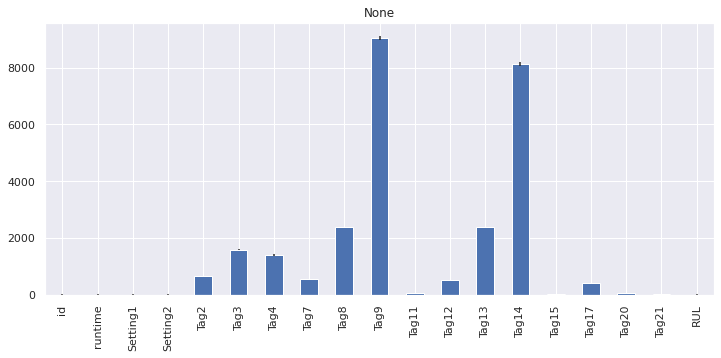

In [ ]:
df_start = df.loc[df['runtime'] < 10.0].copy()
cols_data = [col for col in df.columns if col.startswith('Tag')]
cols_non_data = [col for col in df.columns if not col.startswith('Tag')]
bias = df_start.mean()
scale = df_start.var()

bias[cols_non_data] = 1.0
scale[cols_non_data] = 1.0

ax = bias.plot.bar(yerr=scale, subplots=True, figsize=(12, 5))

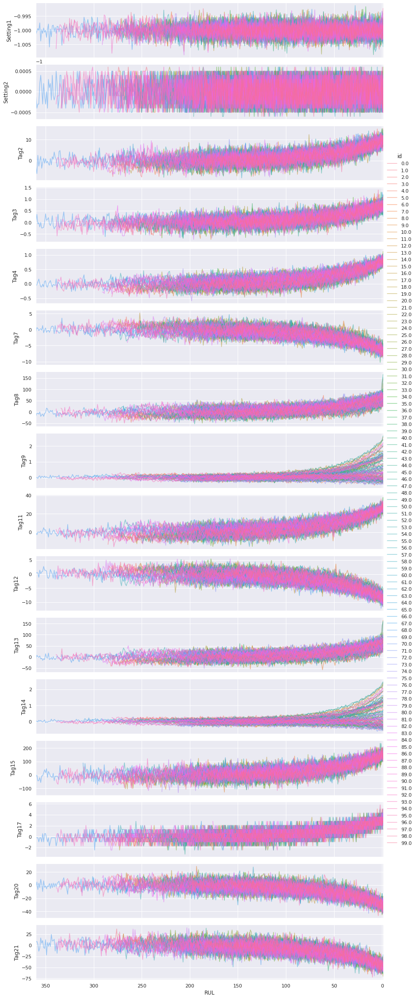

In [ ]:
df_normalized = (df - bias) / scale
plot_grouped_by_RUL(df_normalized[cols])